In [1]:
import fxcmpy
import numpy as np
import pandas as pd
import datetime as dt
import cufflinks as cf
import warnings; warnings.simplefilter('ignore')
from statsmodels.tsa.stattools import adfuller
cf.set_config_file(offline=True)
from ta import *

In [2]:
import fxcmpy
import talib
api = fxcmpy.fxcmpy(config_file='fxcm.cfg')

In [3]:
data = api.get_candles('US30', period='m1',start = dt.datetime(2019,10, 10), end = dt.datetime(2019, 10, 24))


In [4]:
data.iloc[-5:, 4:]

,askopen,askclose,askhigh,asklow,tickqty
date,,,,,
2019-10-23 23:56:00,26856.4,26854.8,26857.4,26854.7,108
2019-10-23 23:57:00,26854.8,26854.8,26854.8,26853.8,62
2019-10-23 23:58:00,26854.8,26854.6,26856.1,26853.8,114
2019-10-23 23:59:00,26854.6,26856.7,26859.1,26854.6,133
2019-10-24 00:00:00,26856.7,26854.8,26857.4,26851.6,404


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13594 entries, 2019-10-10 00:00:00 to 2019-10-24 00:00:00
Data columns (total 9 columns):
bidopen     13594 non-null float64
bidclose    13594 non-null float64
bidhigh     13594 non-null float64
bidlow      13594 non-null float64
askopen     13594 non-null float64
askclose    13594 non-null float64
askhigh     13594 non-null float64
asklow      13594 non-null float64
tickqty     13594 non-null int64
dtypes: float64(8), int64(1)
memory usage: 1.0 MB


In [6]:
spread = (data['askclose'] - data['bidclose']).mean()  
spread

1.7429998528763002

In [7]:
data['midclose'] = (data['askclose'] + data['bidclose']) / 2
data['KMA']=talib.KAMA(data['midclose'], timeperiod=60)

In [8]:
ptc = spread / data['midclose'].mean()  
ptc

6.495780804297282e-05

In [9]:
data['midclose'].plot(figsize=(10, 6), legend=True);

In [10]:
#data['returns'] = np.log(data['midclose'] / data['midclose'].shift(1))
data['returns'] = np.log(data['KMA'] / data['KMA'].shift(1))

In [11]:
data.dropna(inplace=True)

In [12]:
lags = 20

In [13]:
cols = []
for lag in range(1, lags + 1):
    col = 'lag_{}'.format(lag)
    data[col] = data['returns'].shift(lag)  
    cols.append(col)

In [14]:
data.dropna(inplace=True)

In [15]:
data[cols] = np.where(data[cols] > 0, 1, 0)

In [16]:
data['direction'] = np.where(data['returns'] > 0, 1, -1)

In [17]:
data[cols + ['direction']].head()

,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,...,lag_12,lag_13,lag_14,lag_15,lag_16,lag_17,lag_18,lag_19,lag_20,direction
date,,,,,,,,,,,,,,,,,,,,,
2019-10-10 01:21:00,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2019-10-10 01:22:00,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2019-10-10 01:23:00,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2019-10-10 01:24:00,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2019-10-10 01:25:00,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [18]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

In [19]:
model = SVC(C=100, kernel='rbf')

In [20]:
split = int(len(data) * 0.70)
split

9459

In [21]:
train = data.iloc[:split].copy()

In [22]:
model.fit(train[cols], train['direction'])

SVC(C=100, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [23]:
accuracy_score(train['direction'], model.predict(train[cols]))

0.9365683476054552

In [24]:
test = data.iloc[split:].copy()

In [25]:
test['position'] = model.predict(test[cols])

In [26]:
accuracy_score(test['direction'], test['position'])

0.928712382831771

In [27]:
test['strategy'] = test['position'] * test['returns']

In [28]:
sum(test['position'].diff() != 0)

282

In [29]:
test['strategy_tc'] = np.where(test['position'].diff() != 0,
                               test['strategy'] - ptc,  
                               test['strategy'])

In [30]:
test[['returns', 'strategy', 'strategy_tc']].sum(
        ).apply(np.exp)

returns        1.001298
strategy       1.051658
strategy_tc    1.032569
dtype: float64

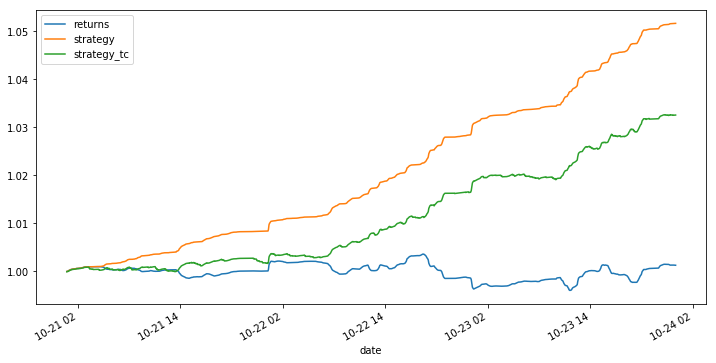

In [31]:
test[['returns', 'strategy', 'strategy_tc']].cumsum(
        ).apply(np.exp).plot(figsize=(12, 6));

In [32]:
# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test['direction'], test['position'])

In [33]:
cm


array([[1565,  143],
       [ 146, 2200]])

In [34]:
# Applying k-Fold Cross Validation
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = model, X = train[cols], y = train['direction'], cv = 10)
accuracies

array([0.91860465, 0.92600423, 0.94926004, 0.92917548, 0.9397463 ,
       0.93551797, 0.91437632, 0.89957717, 0.94186047, 0.92592593])

In [35]:
accuracies.mean()

0.9280048547490409

In [36]:
accuracies.std()

0.013892438116781588

In [38]:
full_pred = model.predict(data[cols])
data['position'] = full_pred
data['strategy'] = data['position'] * data['returns']
# in-sample | unleveraged | no bid-ask spread or transaction costs
data.loc[train[cols].index][['returns', 'strategy']].cumsum().apply(np.exp).iplot()